In [69]:
%load_ext autoreload
%autoreload 2

from pathlib import Path
from collections import Counter

import pandas as pd
import matplotlib.pyplot as plt

from src.alto import load_alto

from src.segmentation import (
    alto_to_regions,
    vlm_json_to_regions,
)

from src.lmstudio import load_result

from src.visualization import (
    display_regions,
    compare_regions,
)

from src.evaluation import (
    match_regions,
    metrics_by_type,
)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Configuration

In [70]:
DATA = Path("../data")

# IMAGE_ID = "1280_AB010309_0005"
# IMAGE_ID = "00003-747-AB009300"
# IMAGE_ID = "00003-1345-AB009712"
# IMAGE_ID = "00007-97-AB008730"
# IMAGE_ID = "436_AB008999_0003"
IMAGE_ID = "670_AB009188_0003"

source = DATA / "images" / f"{IMAGE_ID}.tif"
alto_path = DATA / "alto" / f"{IMAGE_ID}.xml"

result_8b_path = (
    DATA
    / "results"
    / IMAGE_ID
    / "qwen3-vl-8b"
    / "segmentation-v1.json"
)

result_30b_path = (
    DATA
    / "results"
    / IMAGE_ID
    / "qwen3-vl-30b"
    / "segmentation-v1.json"
)

## Load eScriptorium data

In [71]:
alto = load_alto(alto_path)

escriptorium_regions = alto_to_regions(
    alto
)

print(
    f"eScriptorium regions: "
    f"{len(escriptorium_regions)}"
)

eScriptorium regions: 11


## Load saved Qwen experiments

In [72]:
saved_8b = load_result(
    result_8b_path
)

saved_30b = load_result(
    result_30b_path
)

qwen_8b_regions = vlm_json_to_regions(
    saved_8b["response"],
    source="qwen3-vl-8b",
)

qwen_30b_regions = vlm_json_to_regions(
    saved_30b["response"],
    source="qwen3-vl-30b",
)

### Quick check

In [73]:
print(
    "eScriptorium:",
    len(escriptorium_regions)
)

print(
    "Qwen 8B:",
    len(qwen_8b_regions)
)

print(
    "Qwen 30B:",
    len(qwen_30b_regions)
)

eScriptorium: 11
Qwen 8B: 5
Qwen 30B: 6


## Region Inventory

In [74]:
def region_counts(regions):
    return Counter(
        region.region_type
        for region in regions
    )


systems = {
    "eScriptorium": escriptorium_regions,
    "Qwen 8B": qwen_8b_regions,
    "Qwen 30B": qwen_30b_regions,
}


region_types = sorted({
    region.region_type
    for regions in systems.values()
    for region in regions
})


rows = []

for region_type in region_types:

    row = {
        "region_type": region_type,
    }

    for system_name, regions in systems.items():

        row[system_name] = region_counts(
            regions
        ).get(
            region_type,
            0,
        )

    rows.append(row)


counts_df = pd.DataFrame(rows)

counts_df

,region_type,eScriptorium,Qwen 8B,Qwen 30B
0,archival_mark,0,2,1
1,handwritten_annotation,0,1,3
2,main_text,11,1,1
3,stamp_or_seal,0,1,1


## Look at each segmentation separately

(<Figure size 1200x1600 with 1 Axes>, <Axes: >)

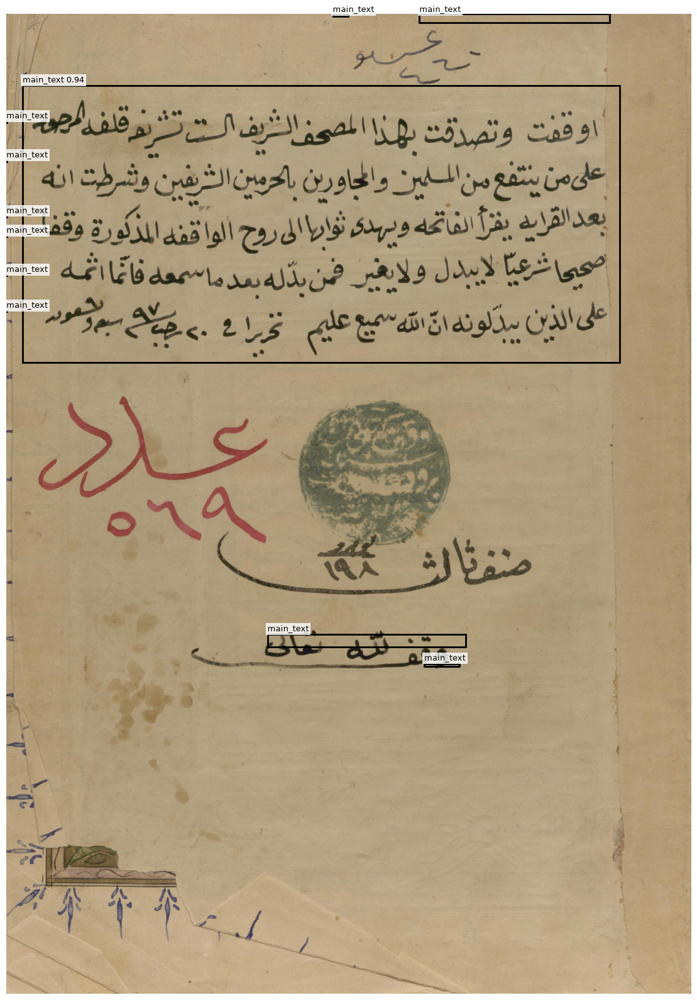

In [75]:
display_regions(
    source,
    escriptorium_regions,
)

(<Figure size 1200x1600 with 1 Axes>, <Axes: >)

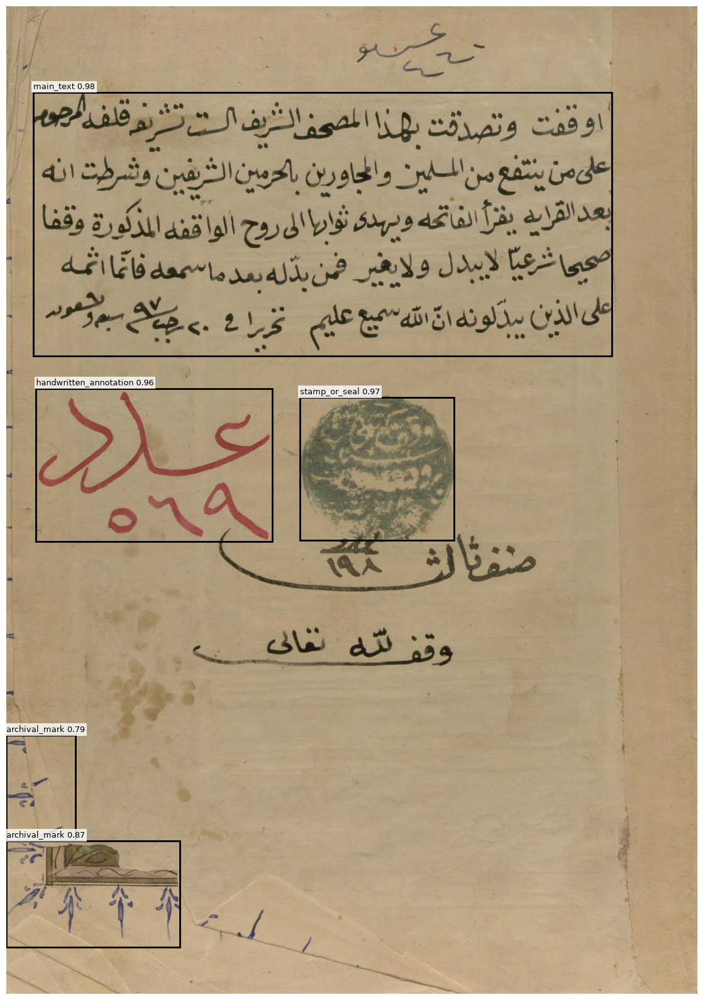

In [76]:
# 8b

display_regions(
    source,
    qwen_8b_regions,
)

(<Figure size 1200x1600 with 1 Axes>, <Axes: >)

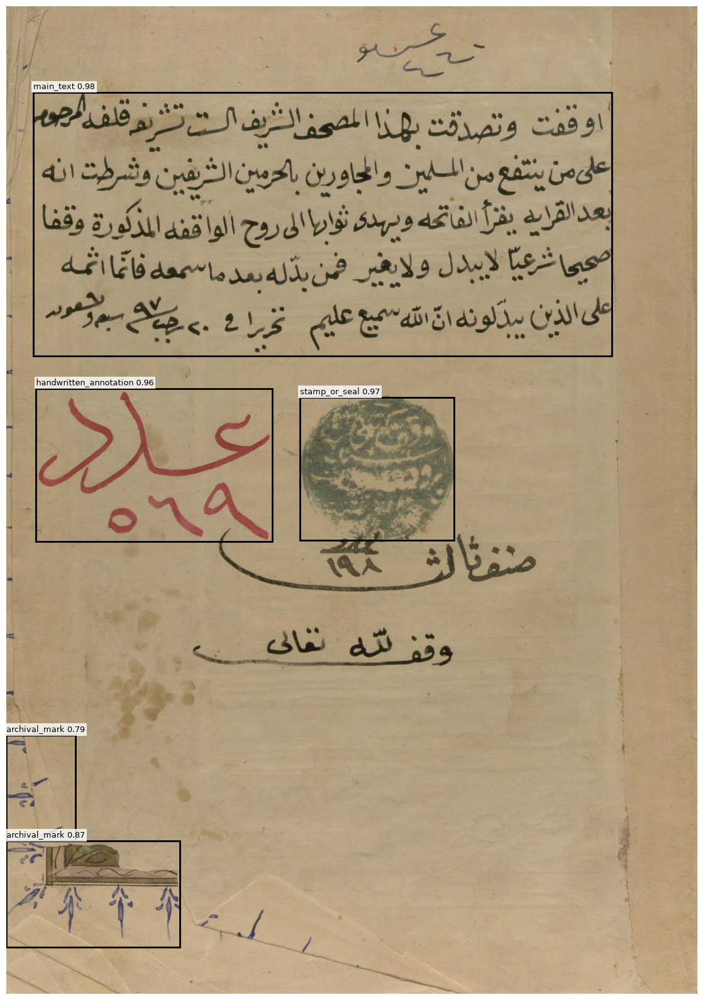

In [77]:
# 30b
display_regions(
    source,
    qwen_8b_regions,
)

> **Question**: Do these segmentations look correct to Humans?

## Pairwize overlays

### Qwen models

(<Figure size 1200x1600 with 1 Axes>, <Axes: >)

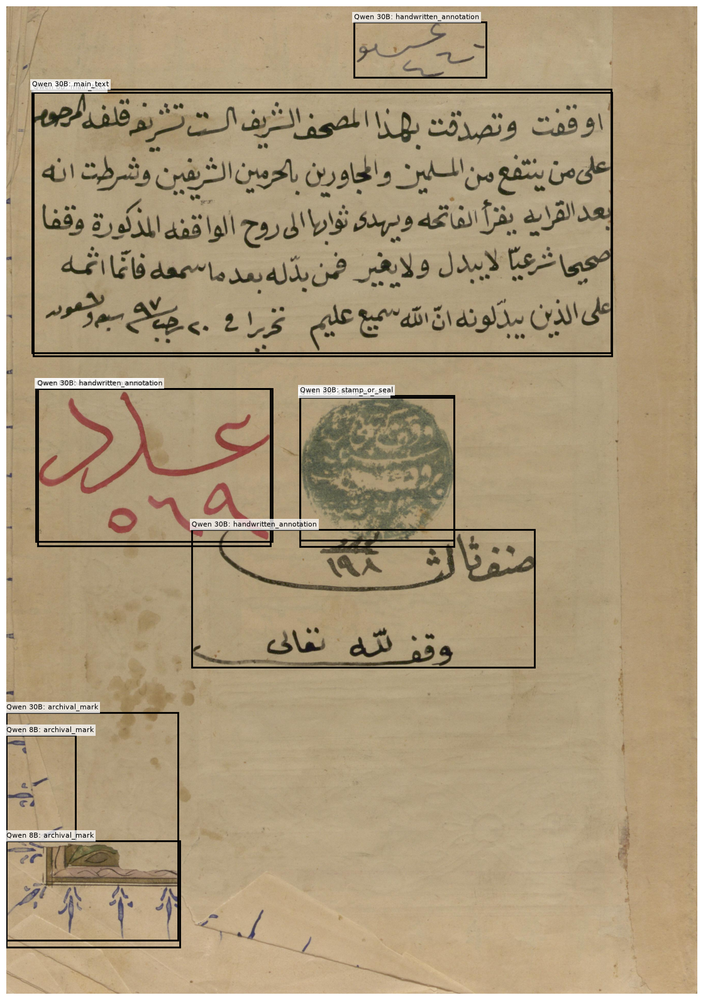

In [78]:
compare_regions(
    source,
    [
        ("Qwen 8B", qwen_8b_regions),
        ("Qwen 30B", qwen_30b_regions),
    ],
)

### eScriptorium v 30B

(<Figure size 1200x1600 with 1 Axes>, <Axes: >)

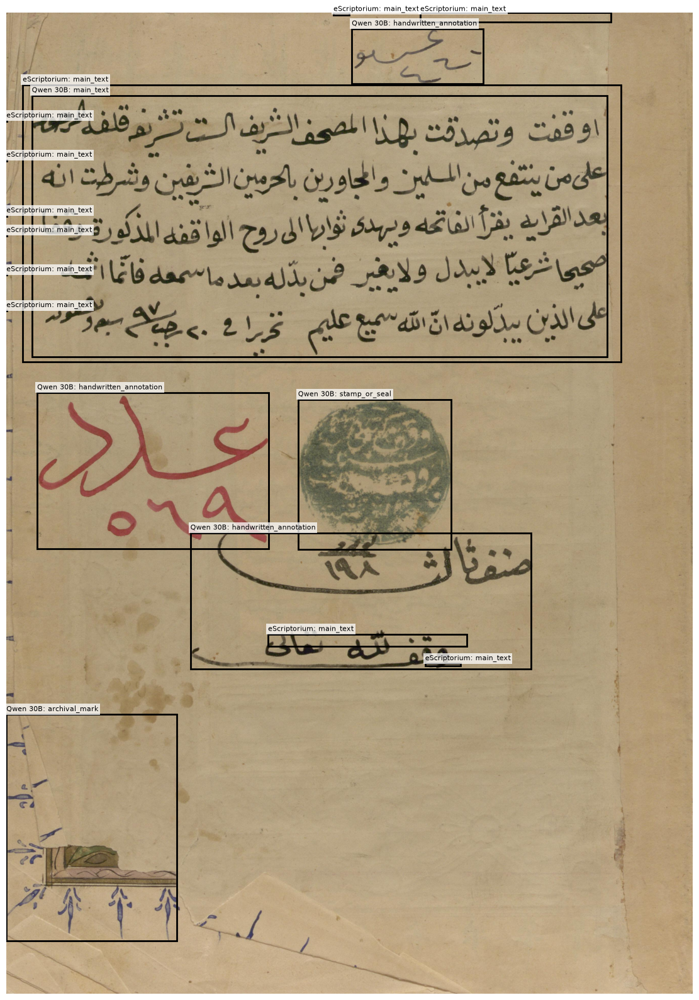

In [79]:
compare_regions(
    source,
    [
        (
            "eScriptorium",
            escriptorium_regions,
        ),
        (
            "Qwen 30B",
            qwen_30b_regions,
        ),
    ],
)

## Inspect Qwen disagreement

In [80]:
matches, unmatched_8b, unmatched_30b = (
    match_regions(
        qwen_8b_regions,
        qwen_30b_regions,
        iou_threshold=0.5,
        require_same_type=False,
    )
)

In [81]:
for match in matches:

    print(
        f"{match.truth.region_type:25}"
        f" → "
        f"{match.prediction.region_type:25}"
        f" IoU={match.iou:.2f}"
    )

main_text                 → main_text                 IoU=0.97
handwritten_annotation    → handwritten_annotation    IoU=0.96
stamp_or_seal             → stamp_or_seal             IoU=0.95


## Examine unmatched regions

In [82]:
print("Only Qwen 8B:")

for region in unmatched_8b:
    print(
        region.region_type,
        region.bbox,
    )

Only Qwen 8B:
archival_mark (0.0, 845.0, 251.0, 953.0)
archival_mark (0.0, 738.0, 100.0, 845.0)


In [83]:
print("Only Qwen 30B:")

for region in unmatched_30b:
    print(
        region.region_type,
        region.bbox,
    )

Only Qwen 30B:
handwritten_annotation (503.0, 16.0, 694.0, 72.0)
handwritten_annotation (268.0, 530.0, 764.0, 669.0)
archival_mark (0.0, 715.0, 248.0, 946.0)


## Create crops of disagreements

In [84]:
from src.images import (
    crop_normalized_bbox,
)

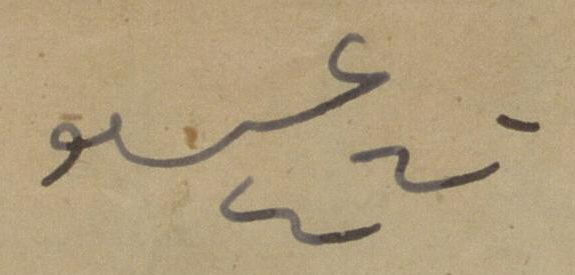

0 handwritten_annotation 0.95


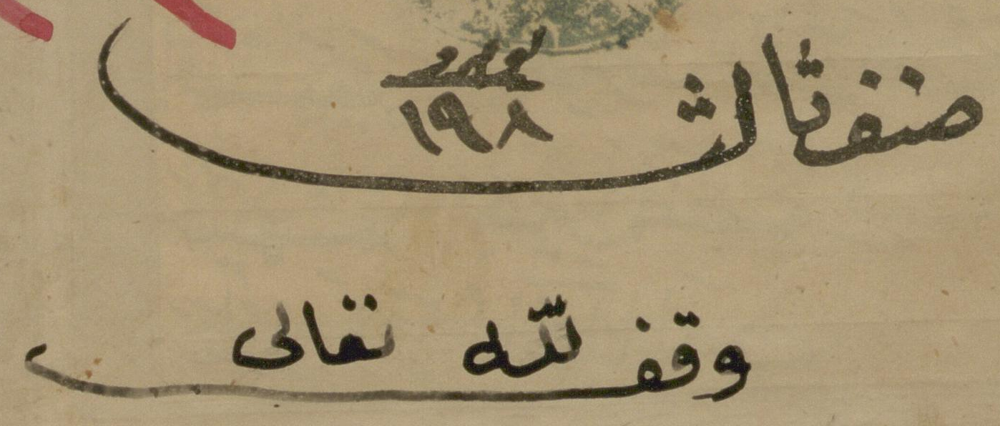

1 handwritten_annotation 0.93


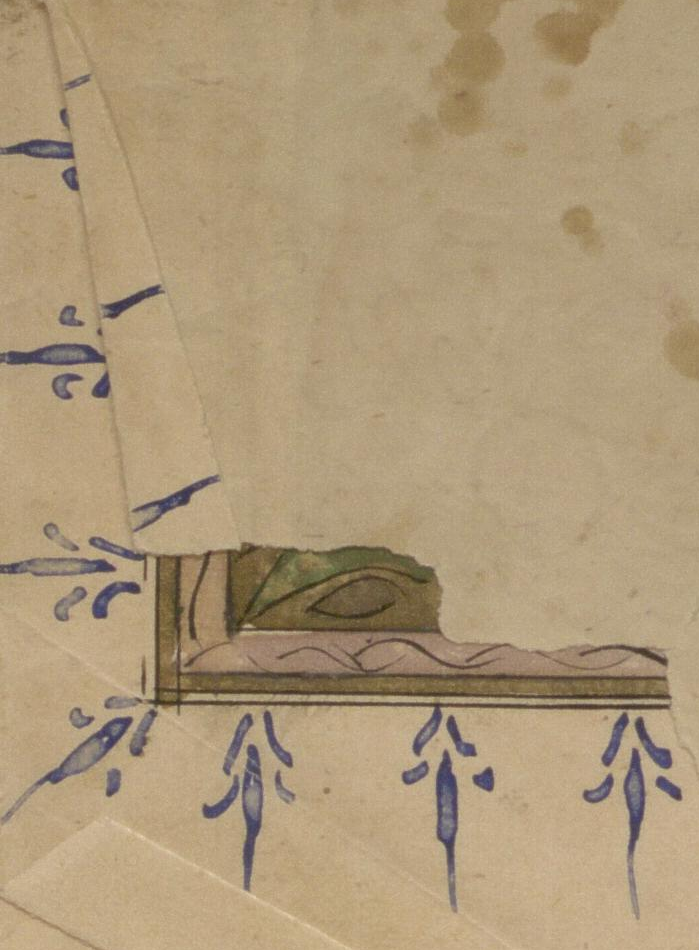

2 archival_mark 0.91


In [85]:
for i, region in enumerate(
    unmatched_30b
):

    crop = crop_normalized_bbox(
        source,
        region.bbox,
        padding=30,
    )

    display(crop)

    print(
        i,
        region.region_type,
        region.confidence,
    )

> **No ground truth is currently available for this page.**
>
> Comparisons between eScriptorium, Qwen8B, and Qwen 30B measure agreement between systems, not accuracy. Human-reviewed regions are required before calculating segmentation performance.

## Human Annotation